In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import scrublet as scr
import seaborn as sns
import seaborn.objects as so
from pipeline.utils import load_h5_data
from pathlib import Path

sc.settings.figdir = '/home/zhangh5/work/prePOLAR/hz-analysis/outputs/Step1.2B-combined_scanorama_corrected_H5_annotated_UMAPs'
sc.settings.figdir.mkdir(parents=True, exist_ok=True)
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    # color_map="YlGnBu",
    frameon=False,
)

from matplotlib.pyplot import rc_context
from matplotlib.backends.backend_pdf import PdfPages

# Load and inspect data

In [2]:
combined_h5 = '/Users/haochen/Desktop/prePOLAR/snRNAseq/hz-analysis/outputs/Step1.2-combined_H5/post_cellbender_all_samples-COMBINED_adata.h5ad'
combined_h5 = 'home/zhangh5/work/prePOLAR/hz-analysis/outputs/Step1.2-combined_H5/COMBINED_adata.harmony_integrated.h5ad'
adata = sc.read_h5ad(combined_h5)

In [3]:
adata

AnnData object with n_obs × n_vars = 62960 × 36601
    obs: 'sample_name', 'batch', 'n_genes', 'n_counts', 'scrublet_scores', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_5_genes', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts_sat', 'n_genes_sat', 'percent_mito', 'leiden', 'Moffitt_basal', 'Moffitt_classical', 'Bailey_squamous', 'Bailey_progenitor', 'Collison_QM', 'Collison_classical', 'MALIGNANT CELLS', 'ACINAR', 'Alpha', 'Beta', 'Delta', 'Gamma', 'Episilon', 'ENDOCRINE', 'ENDOTHELIAL', 'Pan_Immune', 'AntigenPresentingCells', 'Monocytes_1', 'Monocytes_2', 'Macrophage', 'cDC1', 'cDC2', 'DC_activated', 'pDC', 'Mast', 'Eosinophils', 'Neutrophils', 'M0', 'M1', 'M2', 'Mast_Resting', 'Mast_activated', 'CD8_Tcells', 'CD4_Tcells', 'NK', 'CD8_gammadelta', 'CD8_exhausted', 'CD4_naive', 'CD4_

# Sanity check metadata

Text(0, 0.5, '% Variance Explained')

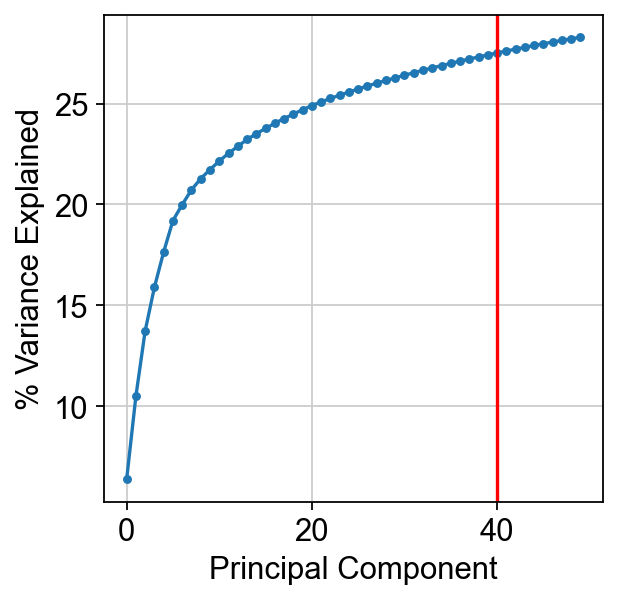

In [6]:
plt.plot(range(len(adata.uns['pca']['variance_ratio'])), np.cumsum(adata.uns['pca']['variance_ratio']) * 100, '.-')
plt.axvline(40, color = 'r')
plt.xlabel('Principal Component')
plt.ylabel('% Variance Explained')

# Load annotation datasheets

In [42]:
# HZ's snRNA-seq QC datasheet

qc_datasheet = '/Users/haochen/Desktop/prePOLAR/snRNAseq/hz-analysis/HZ-prePOLAR-sample_sheet.csv'
qc_df = pd.read_csv(qc_datasheet, header=1, index_col=0)

In [74]:
# WP's clinical datasheet

clinical_datasheet = '/Users/haochen/Desktop/prePOLAR/snRNAseq/WP-iPDAC_snRNAseq_clin_data.V1-hz_marked.csv'
clinical_df = pd.read_csv(clinical_datasheet, index_col=0)

In [75]:
# we need to format the AWS ID column to match that used in the snRNA-seq QC datasheet

clinical_df['snRNA-seq_id'] = clinical_df['AWS_ID'].str.split('EK-').str[1].str.rstrip('/')
clinical_df.set_index('snRNA-seq_id', inplace=True) # this sets the index to the snRNA-seq ID
clinical_df.index.unique().shape # this shows how many unique snRNA-seq ID's there are 

(25,)

## sanity check that every HZ_ID has a record in WP's clinical datasheet

In [77]:
assert qc_df.index.isin(clinical_df.index).all()

# the above might be hard to understand: .all() returns True if all elements in the array are True, and False otherwise 
# here's a more verbose version:

for i in qc_df.index:
    if i not in clinical_df.index:
        print(i)

In [78]:
# we might also want to see how many samples from WP's sheet did not make into the QC sheet, which suggests that they failed snRNA-seq initially and didn't even need to be QC'ed

for i in clinical_df.index:
    if i not in qc_df.index:
        print(i)

# ignoring the nans, the only sample that completely failed snRNA-seq is 1898_12-045_TM_Baseline_1_31_18

nan
nan
1898_12-045_TM_Baseline_1_31_18
nan
nan
nan
nan


## join the QC and clinical datasheets on snRNA-seq sample ID

In [48]:
joint_ann_df = qc_df.join(clinical_df, how='inner') # note that `inner` will only keep the indices (here the sample_names) present in BOTH qc_df and clinical_df

joint_ann_df.index.name = 'sample_SAIL_ID'
joint_ann_df.rename(columns={'sample_id': 'sample_HZ_ID'}, inplace=True)
joint_ann_df.set_index('sample_HZ_ID', inplace=True)

In [49]:
joint_ann_df.to_csv(
    '/Users/haochen/Desktop/prePOLAR/snRNAseq/hz-analysis/HZ-prePOLAR-joint_sample_sheet.csv',
    index=True,
)

# Annotate combined H5

Note: I don't recommend putting in every single column of your clinical data to each corresponding patient's single cells and write the annotated H5, which will be a huge file (close to 10Gb). Because this will write the clinical data multiple times to the many single cells of each patient which wastes disk space.

I suggest just saving the mapping file (joint_ann_df) and use it every time as needed.

## first look at how the samples appear in the UMAP

/Users/haochen/Desktop/prePOLAR/snRNAseq/tools/scanpy/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/haochen/Desktop/prePOLAR/snRNAseq/tools/scanpy/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


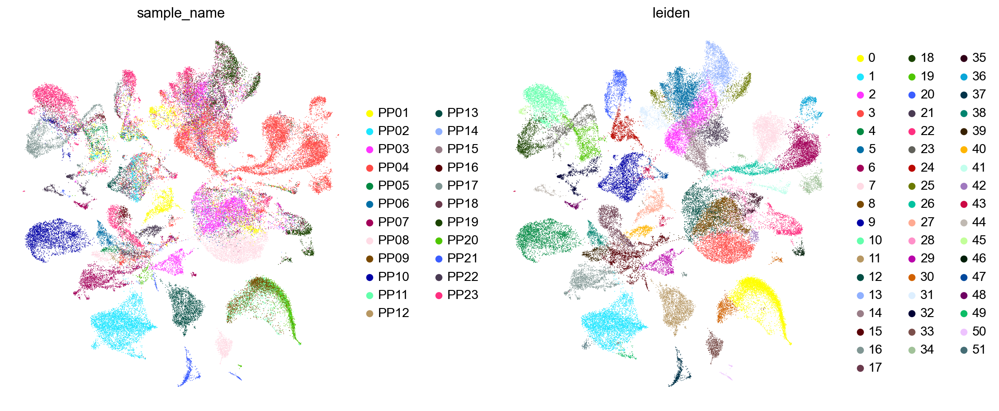

In [37]:
fig, axes = plt.subplots(1,2) # this creates the canvas for us to put the plots on
sc.pl.umap(adata, color="sample_name", show=False, ax=axes[0])
sc.pl.umap(adata, color="leiden", show=False, ax=axes[1])
fig.set_size_inches(14, 6)
fig.tight_layout(pad=1) # this adjusts the spacing between the subplots
# fig

## inspect the general cell types

In [87]:
features_of_interest = ['FIBROBLASTS', 'IMMUNE', 'PANCREATIC_SCHWANN_CELLS', 'ENDOTHELIAL', 'ENDOCRINE', 'CFTR', 'DUCTAL', 'scrublet_scores']

In [90]:
axes

array([[<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >],
       [<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
        <AxesSubplot: >]], dtype=object)

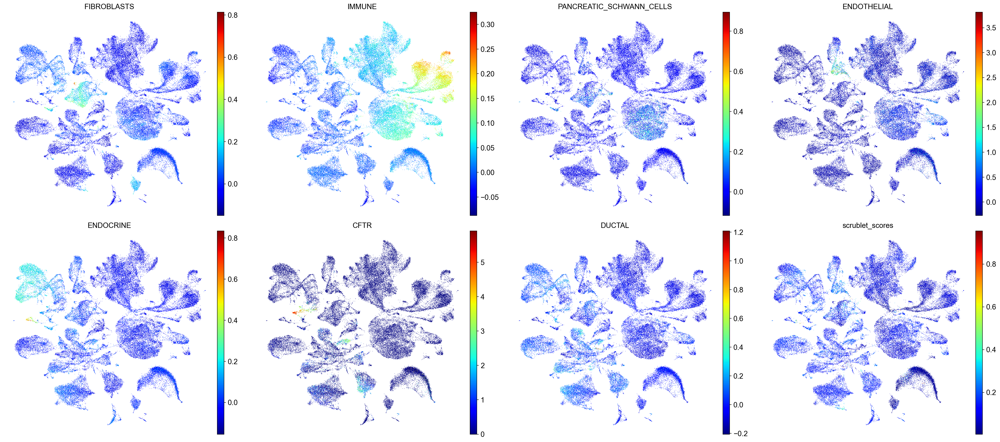

In [104]:
num_features = len(features_of_interest)
if num_features > 4: # if there are more than 4 features, we'll need to make a grid with 2 rows for clarity
    num_cols = 4
    num_rows = num_features//4 + 1
    fig, axes = plt.subplots(num_rows, num_cols) 
    
    for i, feature_i in enumerate(features_of_interest):
        sc.pl.umap(adata, color=feature_i, show=False, ax=axes[i//num_cols, i%num_cols], cmap="jet")
    fig.set_size_inches(6*num_features//2 + 1*(num_features//2 - 1), 12)

else:
    fig, axes = plt.subplots(1,num_features)
    for i, feature_i in enumerate(features_of_interest):
        sc.pl.umap(adata, color=feature_i, show=False, ax=axes[i], cmap="jet")
    fig.set_size_inches(6*num_features + 1*(num_features - 1), 6)


fig.tight_layout(pad=1) # this adjusts the spacing between the subplots
# fig

## Let's try labeling a few most relevant clinical features

In [105]:
features_of_interest = ['Bx.Timing', 'metastatic_first_line_regimen', 'OS', 'LTS_V_STS', 'BRCA']

In [80]:
for feature_i in features_of_interest:
    sample_to_feature_map = joint_ann_df[feature_i].to_dict() # this creates a dictionary mapping sample names to the feature of interest. i.e. {sample_name: feature_value}

    # now we add this dictionary to the adata object as an annotation
    adata.obs[feature_i] = adata.obs['sample_name'].map(sample_to_feature_map)

In [81]:
adata.obs[feature_i]

ACGTCAACAAAGAATC-1-0      BRCA2
GGCTCGACAATTGCTG-1-0      BRCA2
ATCCACCGTTCGAATC-1-0      BRCA2
TCTGGAATCTTCCTTC-1-0      BRCA2
ACAGCTATCTTTACGT-1-0      BRCA2
                          ...  
CTGCTGTCAGCAGTTT-1-22    No_HRD
CTCACACAGTACTTGC-1-22    No_HRD
AGCTTGATCCAAATGC-1-22    No_HRD
CTTGGCTTCAGCTGGC-1-22    No_HRD
TTTGTCACACGTGAGA-1-22    No_HRD
Name: BRCA, Length: 62960, dtype: object

In [115]:
axes

array([<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >],
      dtype=object)

/Users/haochen/Desktop/prePOLAR/snRNAseq/tools/scanpy/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/haochen/Desktop/prePOLAR/snRNAseq/tools/scanpy/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/haochen/Desktop/prePOLAR/snRNAseq/tools/scanpy/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/haochen/Desktop/prePOLAR/snRNAseq/tools/scanpy/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


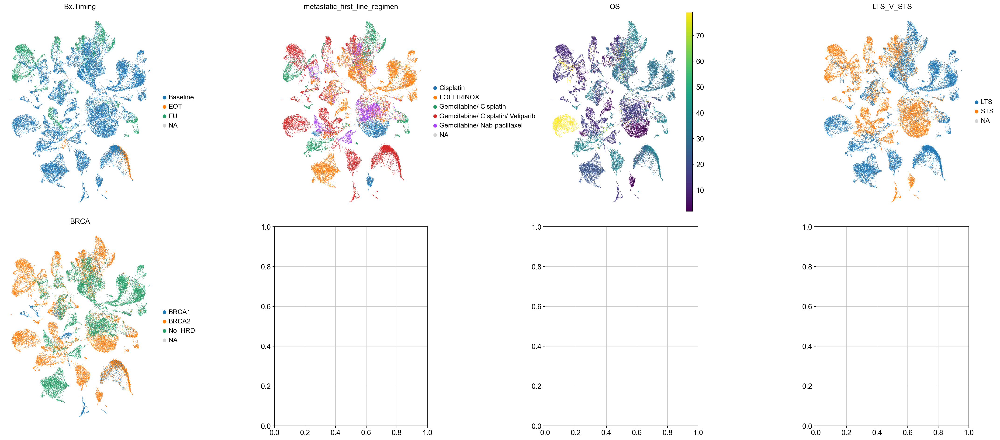

In [117]:
num_features = len(features_of_interest)
if num_features > 4:
    num_cols = 4
    num_rows = num_features//4 + 1
    fig, axes = plt.subplots(num_rows, num_cols) 
    
    for i, feature_i in enumerate(features_of_interest):
        sc.pl.umap(adata, color=feature_i, show=False, ax=axes[i//num_cols, i%num_cols])
    fig.set_size_inches(6*num_cols + 1*(num_cols - 1), num_rows * 6)

else:
    fig, axes = plt.subplots(1,num_features)
    for i, feature_i in enumerate(features_of_interest):
        sc.pl.umap(adata, color=feature_i, show=False, ax=axes[i], cmap="jet")
    fig.set_size_inches(6*num_features + 1*(num_features - 1), 6)


fig.tight_layout(pad=1) # this adjusts the spacing between the subplots
# fig